<a href="https://colab.research.google.com/github/loicmarx/datascience-projects/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class iage classifier using TensorFlow 2.0 and TensorFlow Hub.
##1. Problem definition
Identifiying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is. 

##2. Data

The data we are using is from Kaggle's dog breed identification competition.


##3. Evaluation
 The evaluation is a file with prediction probabilities for each dog breed of each test image.

##4. Features
Some information about the data:
* We are dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.

* There are 120 breeds of dogs (this means there are 120 different classes)
* There are around 10,000+ images in the training set (These images have label)
* There are around 10,000+ images in the test set(these images have no labels, because we want to predict them) 

In [ ]:
#!unzip "drive/My Drive/Dog vision/dog-breed-identification.zip" -d "drive/My Drive/Dog vision/"

## Get our workspace ready
* import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we are using a GPU


In [ ]:
# Import TensorFlow into Colab
#import tensorflow as tf
#print("TF version:", tf. __version__)

In [ ]:
# Immport necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf. __version__)
print("TF Hub version:", hub. __version__)

# Check for GPU availability
print("GPU", "available (YESSSSSS!)" if tf.config.list_physical_devices("GPU") else 'not available')

TF version: 2.5.0
TF Hub version: 0.12.0
GPU available (YESSSSSS!)


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first, turning our images into Tensors (numerical representation). 

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog vision/labels.csv")
print(labels_csv.describe()) 
print(labels_csv.head())


                                      id               breed
count                              10222               10222
unique                             10222                 120
top     0ea78b024dc3955332d3ddb08b8e50f0  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


Here we have 10222 images and 120 different breed.

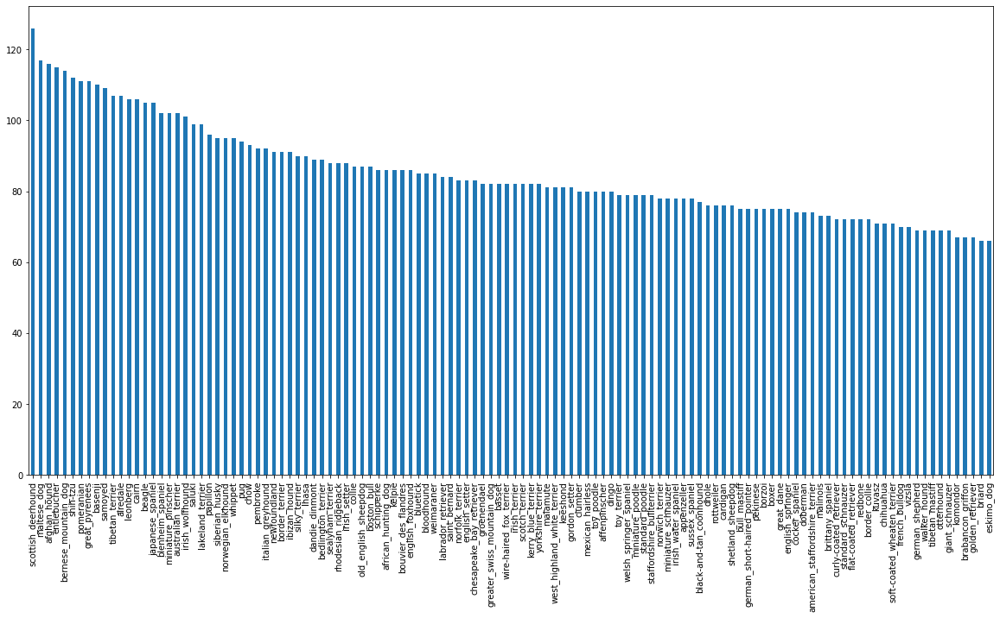

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
# Calculate the median 
labels_csv["breed"].value_counts().median()

82.0

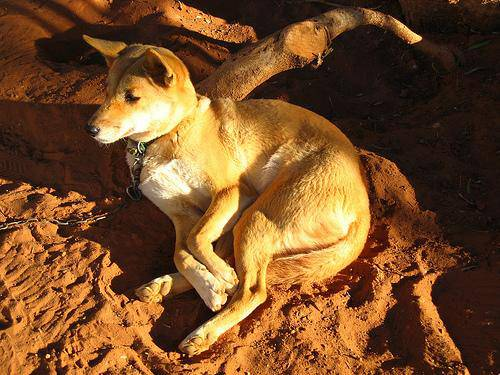

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/My Drive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
#filenames = [fname for fname in labels_csv["id"]]
filenames = ["drive/My Drive/Dog vision/train/"+ fname + ".jpg" for fname in labels_csv["id"]]
# Check the first 10
filenames[:10]

['drive/My Drive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual images files
import os
if len(os.listdir("drive/My Drive/Dog vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!! Proceed. ")
else:
  print("Filenames do not match actual amount of files, check the target directory")

Filenames match actual amount of files!! Proceed. 


Since we have now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels) # does same thing as above
labels 

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
    print("Number of labels does not match number of filenames, check data directories")


Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array 
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # Original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # Index where label occur in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


Now there is a 1 when the actual labels occurs. 

In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/My Drive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we are going to create our own

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

10222 is a lot of sample. We are going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000}

In [ ]:
# Let's split our data into train and valaidation sets
from sklearn.model_selection import train_test_split

# Split them int trainng and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a look at the training data
X_train[:5], y_train[:2]

(['drive/My Drive/Dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

Preprocessing Images ( turning images into Tensors)

To preprocess our images into Tensors, we are going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image(convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

Before we do, let's see what importing an image looks like

In [ ]:
# Convert image to a Numpy 
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

Color of image are  between 0 and 255

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
# Turn image into a tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

The difference between image and tensorFlow is that this tf is able to run on a GPU so a lot faster compute. Now we have seen what an image looks like as a Tensor, let's make a function to preprocess them.

In [ ]:
# Define image size
IMG_SIZE = 224 # important to shape img with same shape

# Create function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor:
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colourr channels (Red , Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value(224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [ ]:

tensor = tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

## Turning our data into batches
Why turn our data into batches?
Let's say we are trying to process 10,000 + images in one go... they all might not fit into memory.
So that's why we do about 32 (this is a batch size based on documentation) images at a time (you can manually adust the batch).
In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:


In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a type of (image, label)
  """


  image = process_image(image_path)
  return image, label

In [ ]:
# DEmo of the above
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all our data ( X & y) into batches !



In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data  if it's training data but doesn't shuffle if it's validation data. 
  Also accepts test data as input (no labels)
  """

  # If the data is a test dataset, we propably don't have labels
  if test_data:
    print("Creating test data batches ...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepath
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return create_data_batches # No label so can run direct process_image function

    # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
      print("Creating validation data batches ...")
      data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #Filepaths
                                                 tf.constant(y))) #labels
      data_batch = data.map(get_image_label).batch(BATCH_SIZE)
      return data_batch

  else:
    print("Creating training batches...")   
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y))) 
    # Shuffling pathnames and labels before mappping image processor function is faster than shuffling
    data = data.shuffle(buffer_size=len(X)) # because we want to shuffle the whole

  # Create (image, label) tuples ( this also turn the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch (BATCH_SIZE)
  return data_batch

                                              

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches (X_val, y_val, valid_data=True)

Creating training batches...
Creating validation data batches ...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

Here for example we have our image in batches of 32.

None is for batch_size eventhough we setup to 32, but stay as None because it is flexible. They have a shape of 224, 224 , 3 (height, weight, color channels). It is image / label pairs . Here we have a dimension of 120 because we have 120 different dog breeds.

## Visualizing Data batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's vizualise them.

In [ ]:
import matplotlib.pyplot as plt

#  Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots ( 5 rows, 5 colonns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")
    

In [ ]:
# Because data in a batch, we need to unbatch it 
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.410844  , 0.57063013, 0.3131724 ],
          [0.42541847, 0.5807924 , 0.3106177 ],
          [0.42361644, 0.5831665 , 0.28179976],
          ...,
          [0.5379392 , 0.59376675, 0.33808905],
          [0.5129601 , 0.5673206 , 0.31384352],
          [0.49579462, 0.5517299 , 0.2958907 ]],
 
         [[0.48772764, 0.6375802 , 0.36089078],
          [0.48397872, 0.6342326 , 0.34231412],
          [0.5214653 , 0.67478114, 0.3556057 ],
          ...,
          [0.4437652 , 0.54977715, 0.26094818],
          [0.5776644 , 0.68331486, 0.39603803],
          [0.5052287 , 0.6112672 , 0.32232437]],
 
         [[0.42414978, 0.557168  , 0.2539467 ],
          [0.51294625, 0.649886  , 0.33481243],
          [0.5164799 , 0.65589106, 0.320705  ],
          ...,
          [0.4558775 , 0.6014804 , 0.28352082],
          [0.5237773 , 0.6682852 , 0.35380197],
          [0.4454435 , 0.5911268 , 0.2729121 ]],
 
         ...,
 
         [[0.46505442, 0.46050262, 0.27321264],
          [0.46404

So now instead of dealing with filename, we are dealing with processed images so more data.
We have taken our train data, unbatched using numpy. So taken the batch off the top and return the image and the label whenever the batch we work.
 

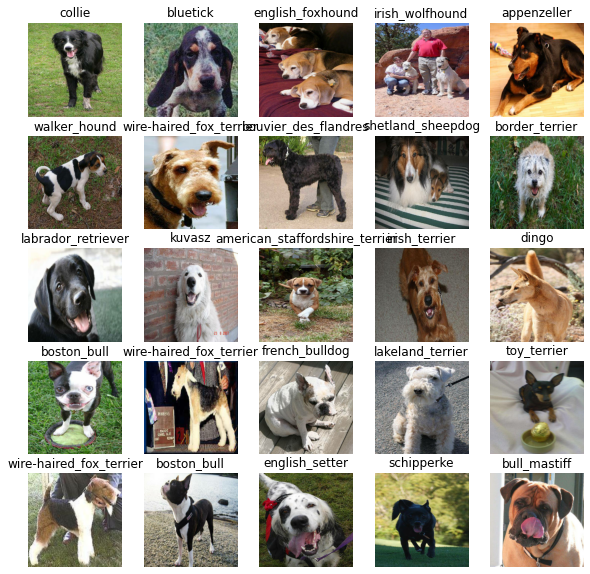

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

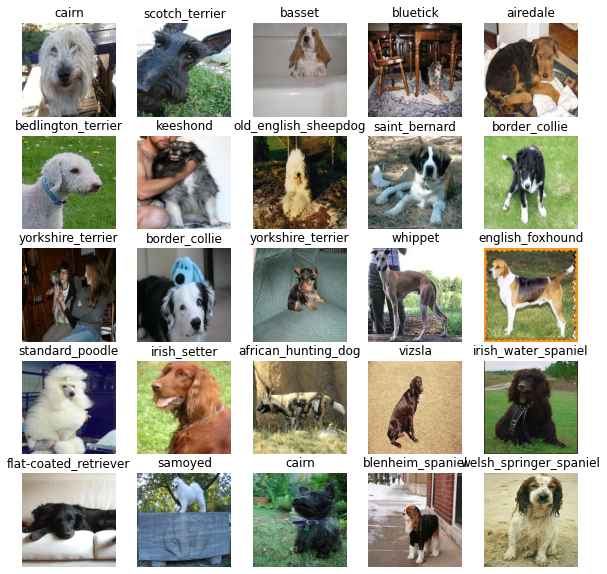

In [ ]:
# Now let's visualize our validation set

val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use. https://tfhub.dev/google/imagenet/mobilenet_v1_100_224/classification/5

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v1_100_224/classification/5"



Now we got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model.
Knowing this, let's create a function which:

* Takes the input shape, output shape, and the model we have chosen as parameters. 

* Defines the layers in a Keras model in a sequential fashion (do this first, then this, then that).

* Compiles the model (says how it should be evalauted and improved).

* Builds the model (tells the model the input shape it will be getting).

* Return the model.


All of this steps can be found on tensorflow/guide/keras/overview


In [ ]:
# Create a dunction which builds a Keras model
def create_model (input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
                              hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
                              tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                    activation="softmax") # Layer 2 (output layer)
                              ])
  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model
  

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v1_100_224/classification/5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              4254889   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 4,375,129
Trainable params: 120,240
Non-trainable params: 4,254,889
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stop improving.

We will create two callbacks, one for TensofrBorad which helps track our models progress and another for early stopping which prevents our model from training for too long. 

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:

1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit function
3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).




In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

#create a function to build a TensorBoard callback
def create_tensorboard_callback():
  #Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog vision/logs",  # need to have access to logs
                        #Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

 Now let's create a early stopping callback to prevent overfitting. If a model is trains for too long, it can do so well at finding patterns in dataset so it doesn't use the pattern on other dataset ( doesn't generalize well). 

### Early stopping callbacks

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops. 


In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model ( on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working. 


In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we are till running on GPU 
print("GPU", "available(yesss)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available(yesss)


Let's create a function which trains a model.
* Create a model using `create_model()`
* Setup a TensorBoiard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we would like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard 
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  # Retun the fitted model
  return model


In [ ]:
  # Fit the model to the data
  model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v1_100_224/classification/5
Epoch 1/100
25/25 [==============================] - 157s 5s/step - loss: 8.9240 - accuracy: 0.0463 - val_loss: 6.5859 - val_accuracy: 0.1000
Epoch 2/100
25/25 [==============================] - 3s 122ms/step - loss: 2.8028 - accuracy: 0.3487 - val_loss: 4.6463 - val_accuracy: 0.2300
Epoch 3/100
25/25 [==============================] - 3s 110ms/step - loss: 0.9832 - accuracy: 0.7225 - val_loss: 3.8631 - val_accuracy: 0.2300
Epoch 4/100
25/25 [==============================] - 3s 115ms/step - loss: 0.3520 - accuracy: 0.9125 - val_loss: 3.8689 - val_accuracy: 0.2750
Epoch 5/100
25/25 [==============================] - 4s 148ms/step - loss: 0.1602 - accuracy: 0.9762 - val_loss: 3.5684 - val_accuracy: 0.3100
Epoch 6/100
25/25 [==============================] - 3s 120ms/step - loss: 0.0709 - accuracy: 0.9937 - val_loss: 3.4325 - val_accuracy: 0.3400
Epoch 7/100
25/25 [==============================]

** Question:** It looks like our model are overfitting because it's performing far better on the training dataset, wht are some way to prevent model overfitting in deep learning neural network?

**Note:** Overfitting to begin with is a good thing! It means our model is learning.

### Checking the TensorBoard logs

The tensorBoard magic function (%tensorboard) will access the logs directory we created earlier and vizualize its contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating prediction using a trained model

In [ ]:
# Make prediction on the validation data ()
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 86ms/step


array([[4.94907545e-05, 1.74326260e-06, 1.50391386e-07, ...,
        4.52023663e-09, 1.91067069e-04, 9.26081929e-03],
       [2.66069292e-05, 2.16357785e-05, 1.11792142e-04, ...,
        1.49364190e-04, 2.69845386e-05, 7.45573379e-06],
       [2.34142683e-09, 9.05811532e-07, 1.23994721e-11, ...,
        1.78215984e-10, 1.27981439e-08, 1.27292685e-02],
       ...,
       [6.06986572e-10, 2.04419757e-06, 8.35698188e-07, ...,
        4.66396523e-06, 3.44734894e-06, 9.40516566e-06],
       [1.10307163e-04, 9.65241270e-06, 1.01547721e-08, ...,
        1.57373364e-10, 2.40007994e-05, 9.19304875e-06],
       [3.73416952e-07, 1.61840362e-07, 6.05378692e-10, ...,
        9.37372278e-08, 6.70295822e-06, 2.21436540e-06]], dtype=float32)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First prediction
index = 0
print(predictions[index])
print(f"Max value(probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[4.94907545e-05 1.74326260e-06 1.50391386e-07 1.53982073e-05
 1.29638565e-07 2.78857101e-07 5.69366559e-04 5.76015013e-09
 2.47168614e-08 1.99109721e-07 2.40904069e-06 1.26447296e-04
 1.03979465e-08 2.57095195e-07 4.69735646e-08 3.58619907e-08
 2.17770104e-08 7.02875695e-05 1.21260314e-07 2.45129606e-08
 1.33524973e-05 5.63507534e-08 1.85744724e-07 4.54723276e-03
 1.19416569e-07 4.70706527e-06 9.10810474e-03 1.05351046e-06
 2.52716909e-05 8.37355998e-08 2.57180704e-06 8.04559659e-06
 1.21519179e-07 8.24439255e-08 6.90929767e-08 4.33627138e-05
 2.13241583e-06 2.72429346e-09 6.51929270e-07 4.07981879e-08
 1.13872852e-06 8.12005851e-10 3.77053722e-09 4.95450593e-07
 2.53484078e-08 4.68622163e-09 7.11381265e-09 9.80034977e-12
 5.41633973e-03 1.47165655e-10 1.42749371e-07 2.78361192e-08
 7.84125732e-05 6.40230411e-08 9.95001074e-07 2.85461734e-08
 2.10536766e-09 4.59657313e-05 1.37483744e-06 3.51191778e-03
 6.47396803e-08 6.92923905e-08 1.21744168e-04 6.72466458e-11
 4.45616649e-07 8.937110

Having the above functionality is great but we want to be able to do it at a scale.
And it would be even better if we could see the image prediction is being made on!

**Note** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn probabilitues into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of the prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]
  # GEt a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label 

'irish_setter'

Since our validation data is still in a batch dataset (efficient for Tensorflow to make calculation), we will have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors ans returns separate arrays of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return  images, labels

  #unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
# Now our goal is to visualize this image and compare this ground truth label to the prediction label
get_pred_label(labels_[0])

'cairn'

Now we have got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images_

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* TAkes an array of prediction probabilities, an array of truth labels and an array of images and an integer. 
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

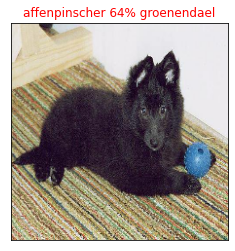

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we have got one function to visualize our models top predictions, let's make another to view our models top 10 predictions

This function will:
*Take an input of prediction probabilites array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  *Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  #Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1] # Descending order
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # FInd the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical") # Because we have string
  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass        

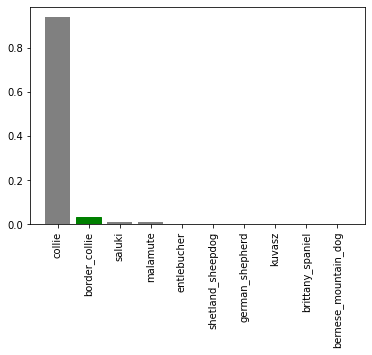

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we have got some function to help us vizualize our predictions and evaluate our model, let's check out.

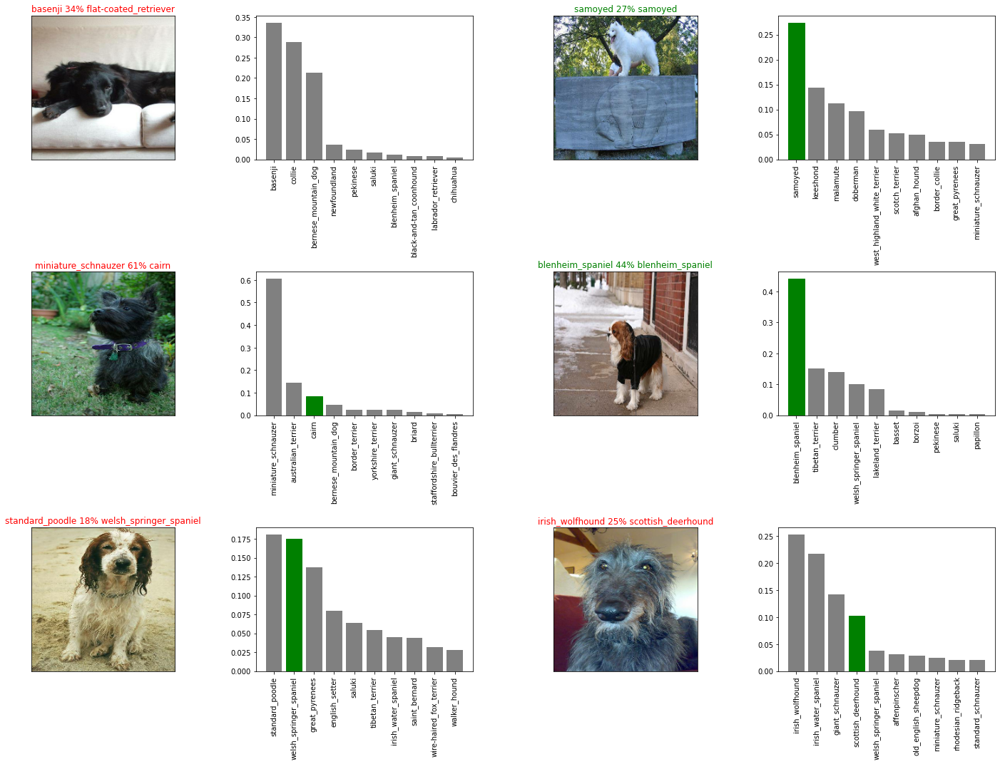

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3 
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and Reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in models directory and appends a suffix(string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" #Save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading a saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
   #hub.Keraslayer: we have an irregular layer never seen before
  return model

Now we have got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog vision/models/20210726-11231627298626-1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog vision/models/20210726-11231627298626-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# LOad a trained model
loaded_1000_image_model = load_model('drive/My Drive/Dog vision/models/20210721-15361626881815-1000-images-mobilenetv2-Adam.h5')

Loading a saved model from: drive/My Drive/Dog vision/models/20210721-15361626881815-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 95ms/step - loss: 3.3824 - accuracy: 0.3400


[3.3823611736297607, 0.3400000035762787]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 79ms/step - loss: 3.0349 - accuracy: 0.3850


[3.0348846912384033, 0.38499999046325684]

## Training a big dog model (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)


Creating training batches...


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v1_100_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while(maybe up to 30 min for the first epoch) because the GPU we are using in the runtime has to load all the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1088s 3s/step - loss: 3.0099 - accuracy: 0.4282
Epoch 2/100
320/320 [==============================] - 30s 93ms/step - loss: 1.2538 - accuracy: 0.6838
Epoch 3/100
320/320 [==============================] - 29s 89ms/step - loss: 0.8233 - accuracy: 0.7722
Epoch 4/100
320/320 [==============================] - 31s 96ms/step - loss: 0.6259 - accuracy: 0.8182
Epoch 5/100
320/320 [==============================] - 29s 89ms/step - loss: 0.4695 - accuracy: 0.8558
Epoch 6/100
320/320 [==============================] - 30s 95ms/step - loss: 0.4030 - accuracy: 0.8746
Epoch 7/100
320/320 [==============================] - 28s 89ms/step - loss: 0.3198 - accuracy: 0.8976
Epoch 8/100
320/320 [==============================] - 31s 96ms/step - loss: 0.2584 - accuracy: 0.9174
Epoch 9/100
320/320 [==============================] - 29s 89ms/step - loss: 0.2627 - accuracy: 0.9160
Epoch 10/100
320/320 [==============================] - 30s 94ms/step - l

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog vision/models/20210726-11541627300487-full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/Dog vision/models/20210726-11541627300487-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
#Load in the full model
loaded_full_model = load_model("drive/My Drive/Dog vision/models/20210726-11541627300487-full-image-set-mobilenetv2-Adam.h5")

Loading a saved model from: drive/My Drive/Dog vision/models/20210726-11541627300487-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been rained on images in the form of Tensor batches, to make predictions on the test data, we will have to get into the same format.

Luckily, we created `create_data_batches()` earlier which can take a list of filename as input and conver them into Tensor batches.

To make predictions on the tet data, we will:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the test_data parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/My Drive/Dog vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]


['drive/My Drive/Dog vision/test/e137b0cd96051765c349377725c4696d.jpg',
 'drive/My Drive/Dog vision/test/e6ec1891d8f52a13683c73cabd3045cb.jpg',
 'drive/My Drive/Dog vision/test/e17defebd1b8fc39e9c3c10df3c2e3de.jpg',
 'drive/My Drive/Dog vision/test/e78b4a09e5f86c330e24c6aaed63f0be.jpg',
 'drive/My Drive/Dog vision/test/e7fcdf9671a6593b638cbee42842f981.jpg',
 'drive/My Drive/Dog vision/test/e6353a9420e1e529b6c20b9414786ae7.jpg',
 'drive/My Drive/Dog vision/test/e4b7ff61849485992246c0f2ab7e8804.jpg',
 'drive/My Drive/Dog vision/test/e265af5e8f446888c6e7ec31f803d63e.jpg',
 'drive/My Drive/Dog vision/test/dffba3aed600801a5f91c5034bec5b08.jpg',
 'drive/My Drive/Dog vision/test/e35b90290702042d17ceee2aaf2d1475.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches ...


**Note** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about 1h). This is beacause we have to process 10,000+ images and get our model to find patterns in those images and generate predictions based on what its learned in the training dataset.

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, 
                                             verbose=1,)

NameError: ignored

In [ ]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog vision/preds_array.csv", test_predictions, delimiter=",")

<function __main__.create_data_batches>

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog vision/preds_array.csv", delimiter=",")

OSError: ignored

In [ ]:
 ## Preparing test dataset predictions for Kaggle
 Looking at the Kagge